Here, I compute $\mathcal{L}(x,t)$ matrix with given model

$ u_t = -\sum_{i} (f_i u)_{x_i} + \sum_{ij} (\Sigma_{ij}u)_{x_ix_j} $

With $\Sigma=\sigma^T\sigma$ a symmetric and positive-definite matrix.

I observe that:

- $-\sum_{i} (f_i u)_{x_i} = -\sum_i (f_i)_{x_i} u + f_i u_{x_i} = - u \nabla_x \cdot f - u_x \cdot f$
- $\sum_{ij} (\Sigma_{ij}u)_{x_i,x_j} = \sum_{ij} (\Sigma_{ij})_{x_ix_j}u + (\Sigma_{ij})_{x_i}u_{x_j} + (\Sigma_{ij})_{x_j}u_{x_i} + \Sigma_{ij}u_{x_ix_j}= u\nabla_x^2\cdot\Sigma + u_x\cdot 2\left(\nabla_x \cdot \Sigma_{n}\right)_n + u_{xx}\cdot\Sigma$

So $u_t = \mathcal{L}u = u \left(\nabla_x^2\cdot\Sigma-\nabla_x \cdot f\right) + u_x \cdot \left(2\left(\nabla_x \cdot \Sigma_{n}\right)_n-f\right) + u_{xx}\cdot\Sigma = \left[\nabla_x^2\cdot\Sigma-\nabla_x \cdot f, 2\left(\nabla_x \cdot \Sigma_{n}\right)_n-f, \Sigma\right]\cdot\left[u,u_x,u_{xx}\right]$

I observe that: $\nabla_x^2\cdot\Sigma = \nabla_x\cdot\left(\nabla_x \cdot \Sigma_{n}\right)_n$, so, in order to simplify the notation I define: $\nabla_x\cdot\Sigma:=\left(\nabla_x \cdot \Sigma_{n}\right)_n$ and so:
$$ u_t = \left[\nabla_x^2\cdot\Sigma-\nabla_x \cdot f, 2\nabla_x \cdot \Sigma - f, \Sigma\right]\cdot\left[u,u_x,u_{xx}\right] $$

IDEA: If the neural network is $2$-differentiable over $x$ we can comput $u_x$ and $u_{xx}$ for each given set of parameters $\theta$.

## Neural Network

I define a simple neural network with only $2$-diff activation functions:

- Final activation $\text{softplus}(x)=\ln(1+e^x)$. This activation is perfect to have only positive values.
- Bounded activation function $\tanh(x)$. Classical activation function in a MLP neural network.
- Unbounded activation functions $\text{GeLU}(x)=x\Phi(x)$. Classical activation function in a MLP neural network as a differentiable variant of $\text{ReLU}$

In [15]:
import torch
import torch.nn as nn
from math import log, exp

# this neural network has only 4 layer with thanh activation function and softplus output
# with hidden size of 64
class SimpleNN(nn.Module):
    def __init__(self, insize:int):
        super(SimpleNN, self).__init__()
        self.layer1 = nn.Linear(insize, 32)
        self.layer2 = nn.Linear(32, 32)
        self.layer3 = nn.Linear(32, 32)
        self.layer4 = nn.Linear(32, 32)
        self.layer5 = nn.Linear(32, 32)
        self.output_layer = nn.Linear(32, 1)
        self.activation = nn.GELU()
        self.output_activation = nn.Softplus()

    def forward(self, x):
        x = self.activation(self.layer1(x))
        x = self.activation(self.layer2(x))
        x = self.activation(self.layer3(x))
        x = self.activation(self.layer4(x))
        x = self.activation(self.layer5(x))
        x = self.output_layer(x)
        return x


## Simple experiment

In this experiment I train this neural network to simulate the theoretical solution. The loss function is:

$$ \mathcal{L}(\theta) = \mathbb{E}\left[(u(X,\theta)-u^{\infty}(X))^2\right] $$

$X$ is a random variable that represents the dataset.

In [16]:
# Example usage
from torch.utils.data import DataLoader, TensorDataset

# initialize the model
model = SimpleNN(2)
# in this example X is normally distributed
# uinf(x) = e^(-2(|x|^2-1)^2)
in_data = torch.randn(4096,2)*2
out_data = torch.exp(-2*(torch.norm(in_data, dim=1)**2-1)**2)[:,None]
data = TensorDataset(in_data, out_data)
dataloader = DataLoader(data, batch_size=1024, shuffle=True)

# define loss function
criterion = nn.MSELoss()

from tqdm.notebook import tqdm
import numpy as np
from torch.optim import SGD, lr_scheduler

loss_at = np.empty([0], dtype=np.float32)

print("Exploring parameter space")
optimizer = SGD(model.parameters(), lr=0.02, momentum=0.9)
model.to('cuda')
epochs = 800
for epoch in tqdm(range(epochs), desc="Training", unit="epoch", colour="blue"):
    for inputs, targets in dataloader:
        x = inputs.to('cuda')
        y = targets.to('cuda')
        optimizer.zero_grad()
        out = model(x)
        loss: torch.Tensor = criterion(out, y)
        loss.backward()
        optimizer.step()
        loss_at = np.append(loss_at, loss.to('cuda').item())
print(f"Reached loss: {loss_at[-1]}")

print("Approaching the local minima")
exp = 0.35
if exp > 0.5:
    print("Warning: the optimization algorithm converges")
scheduler = lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda step: 1.0 / (step + 1)**exp)
model.to('cuda')
epochs = 1600
for epoch in tqdm(range(epochs), desc="Training", unit="epoch", colour="blue"):
    for inputs, targets in dataloader:
        x = inputs.to('cuda')
        y = targets.to('cuda')
        optimizer.zero_grad()
        out = model(x)
        loss: torch.Tensor = criterion(out, y)
        loss.backward()
        optimizer.step()
        loss_at = np.append(loss_at, loss.to('cuda').item())
    # aggiorno l'optimizer
    scheduler.step()
print(f"Reached loss: {loss_at[-1]}")

print("Convergence towards the local minima")
# Robins-Monro criteria
exp = 0.7
if exp > 1:
    print("Warning: the optimization algorithm converges too early")
if exp <= 0.5:
    print("Warning: the optimization algorithm may not converge")
scheduler = lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda step: 1.0 / (step + 1)**exp)
model.to('cuda')
epochs = 3200
for epoch in tqdm(range(epochs), desc="Training", unit="epoch", colour="blue"):
    for inputs, targets in dataloader:
        x = inputs.to('cuda')
        y = targets.to('cuda')
        optimizer.zero_grad()
        out = model(x)
        loss: torch.Tensor = criterion(out, y)
        loss.backward()
        optimizer.step()
        loss_at = np.append(loss_at, loss.to('cuda').item())
    # aggiorno l'optimizer
    scheduler.step()

Exploring parameter space


Training:   0%|          | 0/800 [00:00<?, ?epoch/s]

Reached loss: 0.0005659591406583786
Approaching the local minima


Training:   0%|          | 0/1600 [00:00<?, ?epoch/s]

Reached loss: 0.00017235107952728868
Convergence towards the local minima


Training:   0%|          | 0/3200 [00:00<?, ?epoch/s]

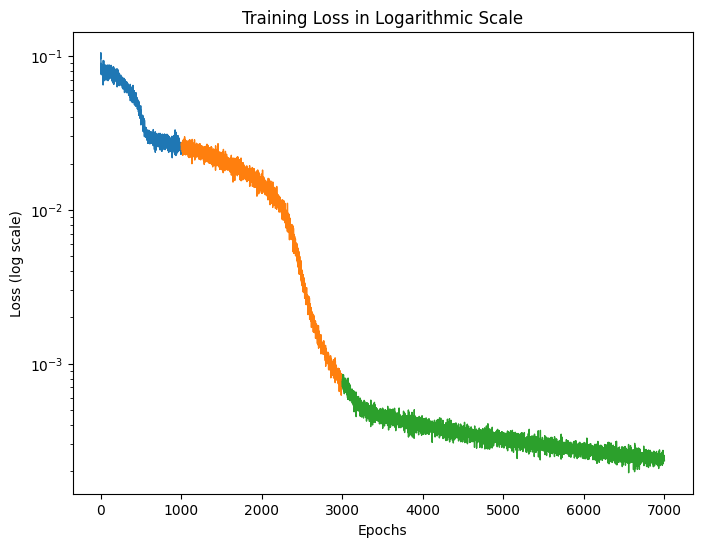

In [17]:
# plot the training loss
from matplotlib import pyplot as plt

# plot in scala logaritmica
plt.figure(figsize=(8, 6))
points = list(range(0,1000))
plt.semilogy(points, loss_at[points], scaley=True, linewidth=1)
points = list(range(1000,3000))
plt.semilogy(points, loss_at[points], scaley=True, linewidth=1)
points = list(range(3000,7000))
plt.semilogy(points, loss_at[points], scaley=True, linewidth=1)
plt.xlabel("Epochs")
plt.ylabel("Loss (log scale)")
plt.title("Training Loss in Logarithmic Scale")
plt.show()

In [18]:
# testing
import numpy as np

x = np.linspace(-5,5,100)
y = np.linspace(-5,5,100)
x_grid, y_grid = np.meshgrid(x,y)
z = np.stack((x_grid, y_grid), axis=-1)
z_lin = z.reshape(-1,2)

model.to('cpu')
z_nn = model(torch.from_numpy(z_lin).to(torch.float32)).detach().numpy().reshape(100,100)
z_uinf = torch.exp(-2*(torch.norm(torch.from_numpy(z), dim=-1)**2-1)**2).detach().numpy()

test_loss = np.mean((z_nn.reshape(-1) - z_uinf.reshape(-1))**2)

print(f"Test loss = {test_loss**0.5}")

Test loss = 0.007670034330616585


In [34]:
# plot the approximation
import numpy as np

x = np.linspace(-5,5,500)
y = np.linspace(-5,5,500)
x_grid, y_grid = np.meshgrid(x,y)
z = np.stack((x_grid, y_grid), axis=-1)
z_lin = z.reshape(-1,2)

model.to('cpu')
z_nn = model(torch.from_numpy(z_lin).to(torch.float32)).detach().numpy().reshape(500,500)
z_uinf = torch.exp(-2*(torch.norm(torch.from_numpy(z), dim=-1)**2-1)**2).detach().numpy()

# plot 3D
import numpy as np
import plotly.graph_objects as go

fig = go.Figure()

fig.add_surface(x=x_grid, y=y_grid, z=z_nn,
                colorscale="Viridis", cmin=0, cmax=1,
                opacity=0.9,
                name="NN approximation")

fig.add_surface(x=x_grid, y=y_grid, z=z_uinf,
                colorscale="Viridis", cmin=0, cmax=1,
                opacity=0.6,
                showscale=False,
                name="Exact function")

fig.update_layout(
    title="NN approximation vs Exact function",
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z"
    )
)

fig.show()